In [136]:
!tree -L 3

python(27184) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


.
├── 5b1802ef89579c0ed05e707f96177cab.grib
├── 5b1802ef89579c0ed05e707f96177cab.grib.5b7b6.idx
├── DL_FIRE_SV-C2_633895
│   ├── Readme.txt
│   └── fire_archive_SV-C2_633895.csv
├── DL_FIRE_SV-C2_633895.zip
├── LCFM_LCM-10_V100_2020_N21E084_cog
│   └── LCFM_LCM-10_V100_2020_N21E084_MAP.tif
├── LCFM_LCM-10_V100_2020_N21E084_cog.zip
├── P5_PAN_CD_N21_000_E086_000_30m
│   └── P5_PAN_CD_N21_000_E086_000_DEM_30m.tif
├── P5_PAN_CD_N21_000_E086_000_30m.zip
├── README.md
├── aligned_inputs
│   ├── aspect.tif
│   ├── fuel.tif
│   ├── slope.tif
│   ├── temp.tif
│   ├── wind_u.tif
│   └── wind_v.tif
├── aspect.tif
├── aspect_wind_mask.tif
├── dem_utm.tif
├── feature_stack.tif
├── feature_stack_fixed.tif
├── final_ignition_mask.tif
├── fire_labels.tif
├── fire_spread_rgb_stack.tif
├── fuel_class.tif
├── fuel_map.tif
├── fuel_mask_final.tif
├── fuel_resampled.tif
├── hillshade.tif
├── igni.png
├── ignition_over_fuel.png
├── ignition_over_ndvi.png
├── ignition_points.csv
├── labels
│   ├── label_000

In [9]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import matplotlib.pyplot as plt
import numpy as np

# Paths
lulc_path = "LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif"
aoi_path = "similipal_aoi.geojson"


In [10]:
# Load AOI
aoi = gpd.read_file(aoi_path)
aoi = aoi.to_crs("EPSG:4326")  

# Mask LULC raster with AOI
with rasterio.open(lulc_path) as src:
    clipped, clipped_transform = mask(src, aoi.geometry, crop=True)
    clipped_meta = src.meta.copy()
    lulc_crs = src.crs

clipped_meta.update({
    "height": clipped.shape[1],
    "width": clipped.shape[2],
    "transform": clipped_transform
})


In [11]:
# Define reclassification rules
fuel_map = np.zeros_like(clipped[0], dtype=np.uint8)

dense_forest = [50, 51, 52]
open_forest = [60, 61]
cropland = [30, 31, 32]
nonburnable = [80, 90, 100]  # water, urban etc.

fuel_map[np.isin(clipped[0], dense_forest)] = 3
fuel_map[np.isin(clipped[0], open_forest)] = 2
fuel_map[np.isin(clipped[0], cropland)] = 1
fuel_map[np.isin(clipped[0], nonburnable)] = 0


In [12]:
# Save reclassified raster
with rasterio.open("fuel_map.tif", "w", **clipped_meta) as dst:
    dst.write(fuel_map, 1)

print("Saved: fuel_map.tif")


Saved: fuel_map.tif


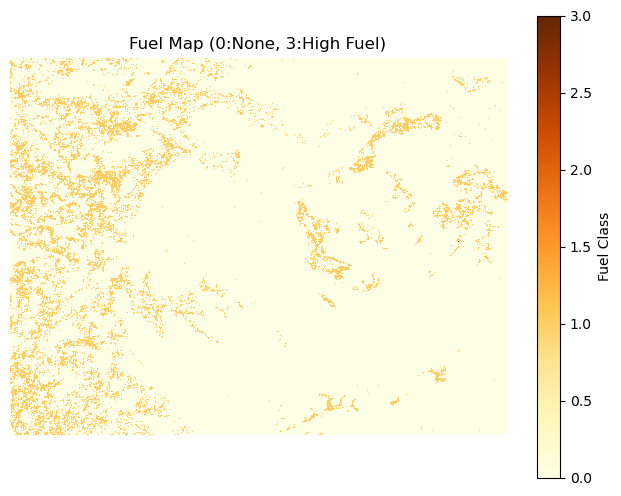

In [13]:
plt.figure(figsize=(8, 6))
plt.imshow(fuel_map, cmap="YlOrBr", interpolation="none")
plt.title("Fuel Map (0:None, 3:High Fuel)")
plt.colorbar(label="Fuel Class")
plt.axis('off')
plt.show()


In [14]:
import pandas as pd
from shapely.geometry import Point
from rasterio.transform import from_origin
from rasterio.features import rasterize

# Paths
fire_csv = "DL_FIRE_SV-C2_633895/fire_archive_SV-C2_633895.csv"
aoi_path = "similipal_aoi.geojson"

# Load fire data
df = pd.read_csv(fire_csv)

# Filter to valid lat/lon
df = df[(df['latitude'].notnull()) & (df['longitude'].notnull())]

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
fire_gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# Clip to AOI
aoi = gpd.read_file(aoi_path).to_crs("EPSG:4326")
fire_clipped = gpd.overlay(fire_gdf, aoi, how='intersection')
print(f"Fire points in AOI: {len(fire_clipped)}")


Fire points in AOI: 1271


In [15]:
# Use fuel map for shape and transform
with rasterio.open("fuel_map.tif") as ref:
    out_shape = (ref.height, ref.width)
    transform = ref.transform
    meta = ref.meta.copy()
    meta.update({"count": 1, "dtype": "uint8"})

# Rasterize: 1 = fire, 0 = no fire
fire_points = [(geom, 1) for geom in fire_clipped.geometry]
fire_raster = rasterize(
    fire_points,
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype="uint8"
)


In [16]:
with rasterio.open("fire_labels.tif", "w", **meta) as dst:
    dst.write(fire_raster, 1)

print("Saved: fire_labels.tif")


Saved: fire_labels.tif


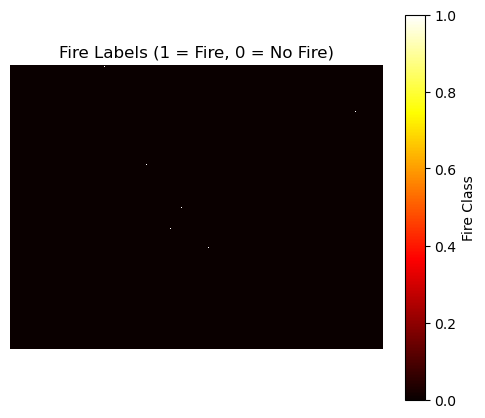

In [17]:
plt.figure(figsize=(6, 5))
plt.imshow(fire_raster, cmap="hot", interpolation="none")
plt.title("Fire Labels (1 = Fire, 0 = No Fire)")
plt.axis('off')
plt.colorbar(label="Fire Class")
plt.show()


In [18]:
!pip install cfgrib ecCodes


In [19]:
import xarray as xr
import rasterio
from rasterio.transform import from_origin
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import box


In [20]:
# Path to your GRIB file
grib_path = "5b1802ef89579c0ed05e707f96177cab.grib"

# Open with xarray + cfgrib engine
ds = xr.open_dataset(grib_path, engine="cfgrib")
ds


skipping variable: paramId==228 shortName='tp'
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/anaconda3/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='time' value=Variable(dimensions=('time',), data=array([1612137600, 1612141200, 1612144800, ..., 1617224400, 1617228000,
       1617231600])) new_value=Variable(dimensions=('time',), data=array([1612116000, 1612159200, 1612202400, 1612245600, 1612288800,
       1612332000, 1612375200, 1612418400, 1612461600, 1612504800,
       1612548000, 1612591200, 1612634400, 1612677600, 1612720800,
       1612764000, 1612807200, 1612850400, 1612893600, 1612936800,
       1612980000, 1613023200, 1613066400, 1613109600, 1613152800,
       1613196000, 1613239200, 1613282400, 1

<xarray.Dataset> Size: 136kB
Dimensions:     (time: 1416, latitude: 2, longitude: 2)
Coordinates:
    number      int64 8B ...
  * time        (time) datetime64[ns] 11kB 2021-02-01 ... 2021-03-31T23:00:00
    step        timedelta64[ns] 8B ...
    surface     float64 8B ...
  * latitude    (latitude) float64 16B 21.93 21.68
  * longitude   (longitude) float64 16B 86.0 86.25
    valid_time  (time) datetime64[ns] 11kB ...
Data variables:
    u10         (time, latitude, longitude) float32 23kB ...
    v10         (time, latitude, longitude) float32 23kB ...
    d2m         (time, latitude, longitude) float32 23kB ...
    t2m         (time, latitude, longitude) float32 23kB ...
    sp          (time, latitude, longitude) float32 23kB ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-07-09T11:23 GRIB to CDM+CF via cfgrib-0.9.1...

In [21]:
# Load AOI bbox
aoi = gpd.read_file("similipal_aoi.geojson").to_crs("EPSG:4326")
aoi_bounds = aoi.total_bounds  # [minx, miny, maxx, maxy]

# Extract a single variable (first time slice if multiple)
u10 = ds["u10"].isel(time=0)  # shape: [lat, lon]

# Crop to AOI bounds
u10_cropped = u10.sel(
    latitude=slice(aoi_bounds[3], aoi_bounds[1]),  # top → bottom
    longitude=slice(aoi_bounds[0], aoi_bounds[2])  # left → right
)

# Flip lat to bottom-to-top
u10_cropped = u10_cropped[::-1]


In [22]:
# Metadata
res = 0.1 
transform = from_origin(
    west=u10_cropped.longitude.values[0],
    north=u10_cropped.latitude.values[-1] + res * u10_cropped.shape[0],
    xsize=res,
    ysize=res
)

with rasterio.open(
    "u10.tif",
    "w",
    driver="GTiff",
    height=u10_cropped.shape[0],
    width=u10_cropped.shape[1],
    count=1,
    dtype="float32",
    crs="EPSG:4326",
    transform=transform,
) as dst:
    dst.write(u10_cropped.values.astype(np.float32), 1)

print("Saved: u10.tif")


Saved: u10.tif


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127788 (\N{WIND BLOWING FACE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


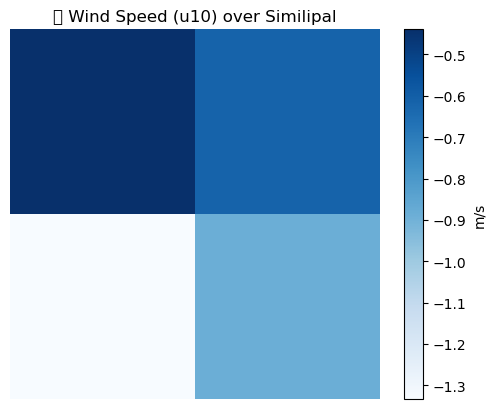

In [23]:
plt.imshow(u10_cropped, cmap="Blues")
plt.title("Wind Speed (u10) over Similipal")
plt.colorbar(label="m/s")
plt.axis('off')
plt.show()


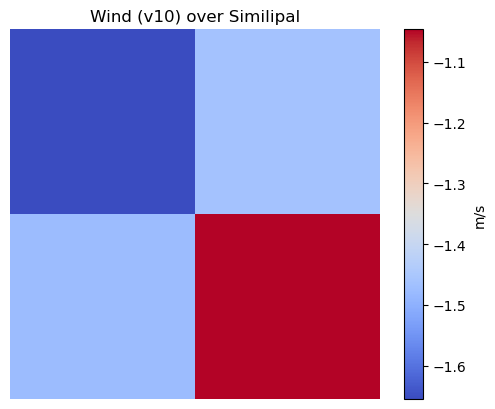

In [24]:
v10 = ds["v10"].isel(time=0)
v10_cropped = v10.sel(
    latitude=slice(aoi_bounds[3], aoi_bounds[1]),
    longitude=slice(aoi_bounds[0], aoi_bounds[2])
)[::-1]

with rasterio.open("v10.tif", "w", driver="GTiff",
                   height=v10_cropped.shape[0], width=v10_cropped.shape[1],
                   count=1, dtype="float32", crs="EPSG:4326", transform=transform) as dst:
    dst.write(v10_cropped.values.astype(np.float32), 1)

plt.imshow(v10_cropped, cmap="coolwarm")
plt.title("Wind (v10) over Similipal")
plt.colorbar(label="m/s")
plt.axis('off')
plt.show()


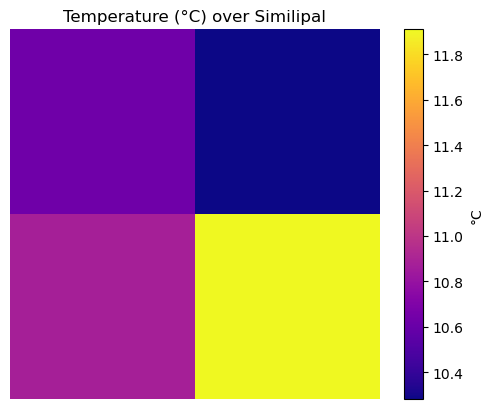

In [25]:
t2m = ds["t2m"].isel(time=0)
t2m_cropped = t2m.sel(
    latitude=slice(aoi_bounds[3], aoi_bounds[1]),
    longitude=slice(aoi_bounds[0], aoi_bounds[2])
)[::-1]

with rasterio.open("t2m.tif", "w", driver="GTiff",
                   height=t2m_cropped.shape[0], width=t2m_cropped.shape[1],
                   count=1, dtype="float32", crs="EPSG:4326", transform=transform) as dst:
    dst.write(t2m_cropped.values.astype(np.float32), 1)

plt.imshow(t2m_cropped - 273.15, cmap="plasma")
plt.title("Temperature (°C) over Similipal")
plt.colorbar(label="°C")
plt.axis('off')
plt.show()


Slope stats ➤ Min: 30.740017 | Max: 89.99992 | Mean: 89.95125


/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
/var/folders/_0/kfxmbs7d2j59ffz9n0c1cy3c0000gn/T/ipykernel_42549/914500532.py:42: UserWarning: Glyph 129517 (\N{COMPASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


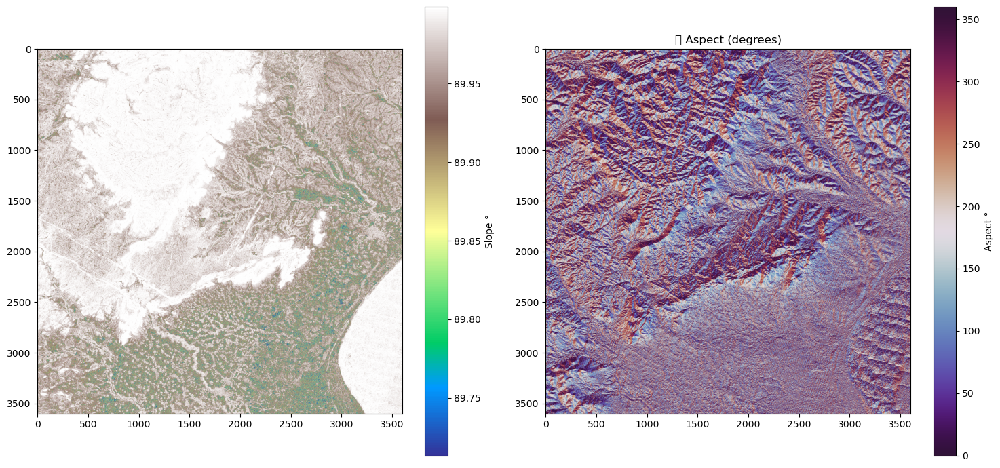

In [10]:
import numpy as np
import rasterio
from rasterio.plot import show
from matplotlib import pyplot as plt
from matplotlib.colors import LightSource

# Path to DEM file (already used earlier)
dem_path = "P5_PAN_CD_N21_000_E086_000_30m/P5_PAN_CD_N21_000_E086_000_DEM_30m.tif"

# Load DEM
with rasterio.open(dem_path) as src:
    dem = src.read(1, masked=True)
    profile = src.profile

# Constants
cellsize_x, cellsize_y = src.res[0], src.res[1]

# Compute gradients
dy, dx = np.gradient(dem, cellsize_y, cellsize_x)

# Compute slope and aspect
slope = np.degrees(np.arctan(np.hypot(dx, dy)))
aspect = (np.degrees(np.arctan2(-dx, dy)) + 360) % 360  # Normalize 0–360

# Visual confirmation
print("Slope stats ➤", "Min:", np.nanmin(slope), "| Max:", np.nanmax(slope), "| Mean:", np.nanmean(slope))

# Plot with fixed contrast
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# 💡 Clip extreme values for better visualization
vmin, vmax = np.percentile(slope[~np.isnan(slope)], [2, 98])

im1 = ax1.imshow(slope, cmap="terrain", vmin=vmin, vmax=vmax)
fig.colorbar(im1, ax=ax1, label="Slope °")


im2 = ax2.imshow(aspect, cmap="twilight_shifted", vmin=0, vmax=360)
fig.colorbar(im2, ax=ax2, label="Aspect °")
ax2.set_title("🧭 Aspect (degrees)")

plt.tight_layout()
plt.show()


In [11]:
from matplotlib.colors import LightSource

ls = LightSource(azdeg=315, altdeg=45)
hillshade = ls.shade(dem, vert_exag=1, blend_mode='overlay', cmap=plt.get_cmap('gray'))

ax1.imshow(hillshade)


In [12]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt

# Reproject DEM to UTM
def reproject_to_utm(src_path, dst_path, dst_crs='EPSG:32645'):
    with rasterio.open(src_path) as src:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        with rasterio.open(dst_path, 'w', **kwargs) as dst:
            for i in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.bilinear)

# Paths
dem_path = "P5_PAN_CD_N21_000_E086_000_30m/P5_PAN_CD_N21_000_E086_000_DEM_30m.tif"
dem_utm_path = "dem_utm.tif"
reproject_to_utm(dem_path, dem_utm_path)


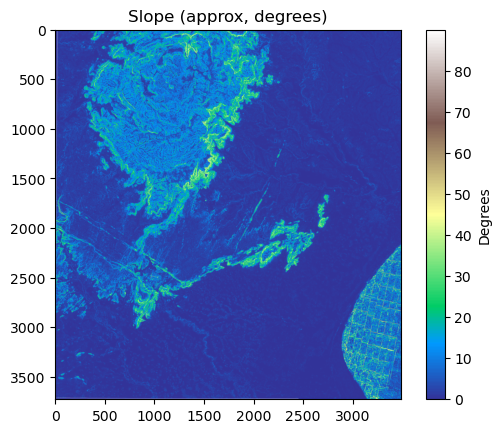

In [13]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

with rasterio.open("dem_utm.tif") as dem_src:
    dem = dem_src.read(1).astype('float32')
    transform = dem_src.transform
    res_x, res_y = transform[0], -transform[4]  # Pixel size in meters

# Calculate gradients
dz_dx, dz_dy = np.gradient(dem, res_x, res_y)
slope_rad = np.arctan(np.sqrt(dz_dx**2 + dz_dy**2))
slope_deg = np.degrees(slope_rad)

# Plot
plt.imshow(slope_deg, cmap='terrain')
plt.title("Slope (approx, degrees)")
plt.colorbar(label="Degrees")
plt.show()


In [8]:
!tree -L 3


.
├── 5b1802ef89579c0ed05e707f96177cab.grib
├── 5b1802ef89579c0ed05e707f96177cab.grib.5b7b6.idx
├── DL_FIRE_SV-C2_633895
│   ├── Readme.txt
│   └── fire_archive_SV-C2_633895.csv
├── DL_FIRE_SV-C2_633895.zip
├── LCFM_LCM-10_V100_2020_N21E084_cog
│   └── LCFM_LCM-10_V100_2020_N21E084_MAP.tif
├── LCFM_LCM-10_V100_2020_N21E084_cog.zip
├── P5_PAN_CD_N21_000_E086_000_30m
│   └── P5_PAN_CD_N21_000_E086_000_DEM_30m.tif
├── P5_PAN_CD_N21_000_E086_000_30m.zip
├── aspect.tif
├── dem_utm.tif
├── fire_labels.tif
├── fuel_class.tif
├── fuel_map.tif
├── main.ipynb
├── similipal_aoi.geojson
├── slope.tif
├── t2m.tif
├── u10.tif
└── v10.tif

4 directories, 20 files


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


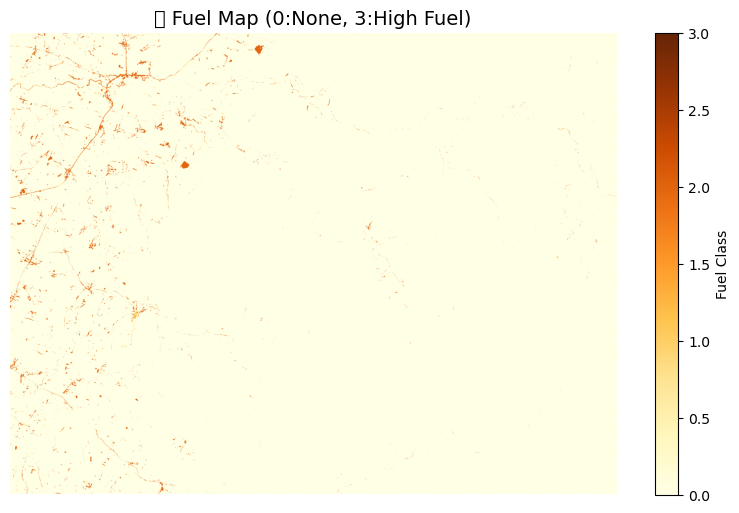

In [9]:
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from rasterio.mask import mask

# === Paths ===
lulc_path = "LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif"
aoi_path = "similipal_aoi.geojson"

# === Load AOI geometry ===
aoi = gpd.read_file(aoi_path)
aoi = aoi.to_crs("EPSG:4326")  # ensure CRS match

# === Clip LULC to AOI ===
with rasterio.open(lulc_path) as src:
    lulc_clipped, transform = mask(src, aoi.geometry, crop=True)
    lulc_meta = src.meta.copy()
    lulc_crs = src.crs

lulc_clipped = lulc_clipped[0]

# === Reclassify LULC values to Fuel Classes ===
fuel_map = np.zeros_like(lulc_clipped)

fuel_map[np.isin(lulc_clipped, [50, 60, 70, 80])] = 1   # scrub, cropland
fuel_map[np.isin(lulc_clipped, [90, 100])] = 2          # grassland
fuel_map[np.isin(lulc_clipped, [110, 120, 130])] = 3    # forests
fuel_map[np.isin(lulc_clipped, [0, 10, 20, 30, 40])] = 0  # water, urban etc

# === Save fuel class map ===
fuel_meta = lulc_meta.copy()
fuel_meta.update({"dtype": "uint8", "count": 1, "transform": transform})

with rasterio.open("fuel_class.tif", "w", **fuel_meta) as dst:
    dst.write(fuel_map, 1)

# === Visualize ===
plt.figure(figsize=(10, 6))
plt.imshow(fuel_map, cmap='YlOrBr', vmin=0, vmax=3)
cbar = plt.colorbar(label="Fuel Class")
plt.title("🔥 Fuel Map (0:None, 3:High Fuel)", fontsize=14)
plt.axis("off")
plt.show()


In [10]:
import os

lulc_folder = "LCFM_LCM-10_V100_2020_N21E084_cog"
print("Files in LULC folder:")
print(os.listdir(lulc_folder))


Files in LULC folder:
['LCFM_LCM-10_V100_2020_N21E084_MAP.tif']


/var/folders/_0/kfxmbs7d2j59ffz9n0c1cy3c0000gn/T/ipykernel_37596/395408651.py:29: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


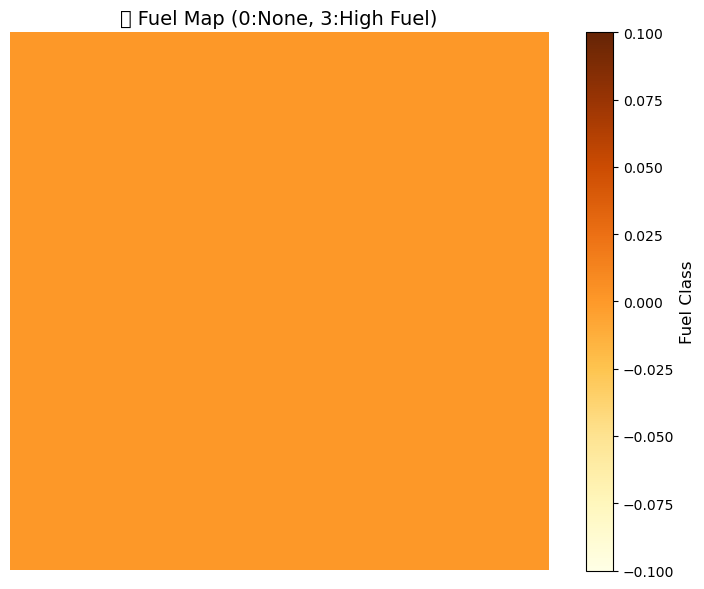

In [11]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

lulc_path = "LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif"

with rasterio.open(lulc_path) as src:
    lulc = src.read(1)[:2048, :2048]  # Load smaller chunk for safety
    profile = src.profile

fuel_map = np.zeros_like(lulc, dtype=np.uint8)

# Moderate fuel
fuel_map[np.isin(lulc, [4, 5, 6])] = 2

# High fuel
fuel_map[np.isin(lulc, [1, 2, 3, 7, 9])] = 3

plt.figure(figsize=(8, 6))
img = plt.imshow(fuel_map, cmap='YlOrBr', interpolation='none')
plt.title("🔥 Fuel Map (0:None, 3:High Fuel)", fontsize=14)
cbar = plt.colorbar(img)
cbar.set_label("Fuel Class", fontsize=12)
plt.axis('off')
plt.tight_layout()
plt.show()


In [1]:
import numpy as np
import rasterio

lulc_path = 'LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif'

with rasterio.open(lulc_path) as src:
    lulc = src.read(1)
    unique_classes = np.unique(lulc)

print("Unique LULC classes in the raster:", unique_classes)


Unique LULC classes in the raster: [ 10  20  30  40  50  60  80  90 100]


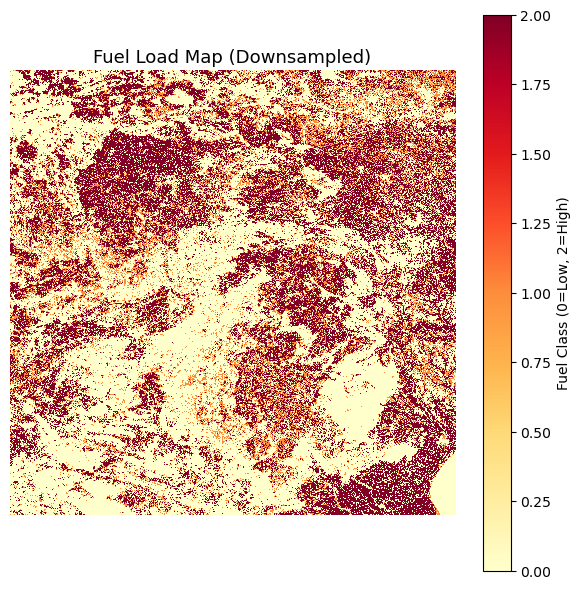

In [1]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

lulc_path = "LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif"
with rasterio.open(lulc_path) as src:
    lulc = src.read(1)
    profile = src.profile

fuel_classes = {
    10: 0,   # Water
    20: 0,   # Urban
    30: 1,   # Cropland
    40: 2,   # Forest
    50: 2,   # Grassland
    60: 1,   # Shrubland
    80: 1,   # Barren
    90: 0,   # Snow/Ice
    100: 0   # No Data
}
fuel_map = np.zeros_like(lulc)
for k, v in fuel_classes.items():
    fuel_map[lulc == k] = v

preview = fuel_map[::4, ::4]

plt.figure(figsize=(6, 6))
plt.imshow(preview, cmap='YlOrRd', interpolation='nearest')
plt.title("Fuel Load Map (Downsampled)", fontsize=13)
plt.colorbar(label='Fuel Class (0=Low, 2=High)')
plt.axis('off')
plt.tight_layout()
plt.show()


In [2]:
# Save fuel map as GeoTIFF
output_path = "fuel_map.tif"
profile.update({
    "dtype": "uint8",
    "count": 1,
    "compress": "lzw"
})

with rasterio.open(output_path, "w", **profile) as dst:
    dst.write(fuel_map.astype(np.uint8), 1)

print("Saved fuel_map.tif")


Saved fuel_map.tif


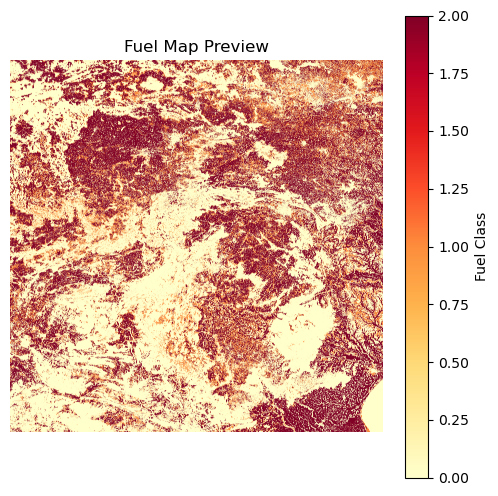

In [3]:
import matplotlib.pyplot as plt
with rasterio.open("fuel_map.tif") as src:
    preview = src.read(1)[::4, ::4]  # downsample again for safety

plt.figure(figsize=(6, 6))
plt.imshow(preview, cmap='YlOrRd')
plt.title("Fuel Map Preview")
plt.colorbar(label="Fuel Class")
plt.axis('off')
plt.show()


In [5]:
print("Slope min:", slope.min())
print("Slope max:", slope.max())
print("Slope unique values:", np.unique(slope.compressed()))


Slope min: 15.330565
Slope max: 89.999916
Slope unique values: [15.330565 16.994942 24.256878 ... 89.9999   89.99991  89.999916]


✅ Slope stats → min: 0.00, max: 81.93, mean: 4.66


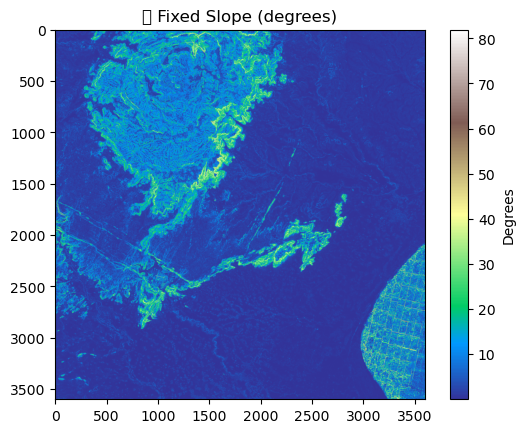

In [19]:
with rasterio.open("slope_fixed.tif") as src:
    slope = src.read(1)
    slope = np.where(slope == src.nodata, np.nan, slope)
    print(f"Slope stats → min: {np.nanmin(slope):.2f}, max: {np.nanmax(slope):.2f}, mean: {np.nanmean(slope):.2f}")

    plt.imshow(slope, cmap='terrain')
    plt.title("Fixed Slope (degrees)")
    plt.colorbar(label='Degrees')
    plt.show()

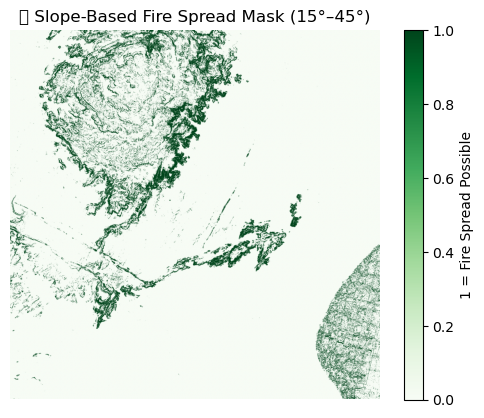

🔥 Valid fire spread zone covers: 9.04% of the area


In [26]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

with rasterio.open("slope_fixed.tif") as src:
    slope_deg = src.read(1)
    slope_meta = src.meta
    slope_deg = np.where(slope_deg == src.nodata, np.nan, slope_deg)

slope_mask = np.where((slope_deg >= 15) & (slope_deg <= 45), 1, 0)

slope_meta.update(dtype='uint8', nodata=0)
with rasterio.open("slope_fire_mask_15_45.tif", 'w', **slope_meta) as dst:
    dst.write(slope_mask.astype('uint8'), 1)

plt.imshow(slope_mask, cmap='Greens')
plt.title("Slope-Based Fire Spread Mask (15°–45°)")
plt.colorbar(label='1 = Fire Spread Possible')
plt.axis('off')
plt.show()

area_percent = (np.sum(slope_mask == 1) / slope_mask.size) * 100
print(f"Valid fire spread zone covers: {area_percent:.2f}% of the area")


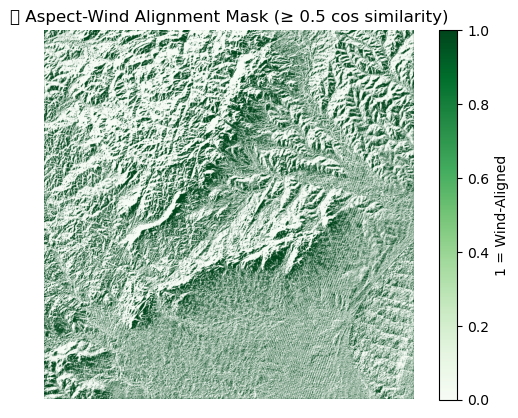

🌬️ Wind-aligned zones cover: 38.55% of the area


In [27]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

aspect_path = "aspect.tif"  
wind_azimuth_deg = 135      

with rasterio.open(aspect_path) as src:
    aspect = src.read(1).astype(np.float32)
    profile = src.profile

# Convert to radians
aspect_rad = np.deg2rad(aspect)
wind_rad = np.deg2rad(wind_azimuth_deg)

# Cosine of difference (higher = more aligned)
alignment_score = np.cos(aspect_rad - wind_rad)

# Threshold mask: fire spread likely if aligned (cos ≥ 0.5 → ≤ 60° diff)
aspect_mask = alignment_score >= 0.5

profile.update(dtype='uint8', count=1, nodata=0)
with rasterio.open("aspect_wind_mask.tif", "w", **profile) as dst:
    dst.write(aspect_mask.astype('uint8'), 1)

plt.imshow(aspect_mask, cmap='Greens')
plt.colorbar(label="1 = Wind-Aligned")
plt.title("🌬️ Aspect-Wind Alignment Mask (≥ 0.5 cos similarity)")
plt.axis('off')
plt.show()

# Print coverage
aligned_percent = (np.sum(aspect_mask) / aspect_mask.size) * 100
print(f"Wind-aligned zones cover: {aligned_percent:.2f}% of the area")


✅ Fuel mask recreated and saved as fuel_mask_final.tif


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


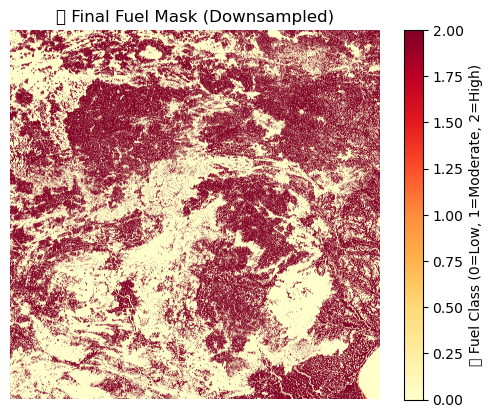

In [29]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

lulc_path = 'LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif'

with rasterio.open(lulc_path) as src:
    lulc = src.read(1)
    profile = src.profile

fuel_map = np.zeros_like(lulc, dtype=np.uint8)

# Assign moderate and high fire risk classes
# Mapping based on Copernicus class codes:
# 30 (Forest) → 2 (High)
# 40 (Shrub) → 2 (High)
# 50 (Grassland) → 1 (Moderate)
# 60 (Cropland) → 1 (Moderate)
fuel_map[np.isin(lulc, [30, 40])] = 2
fuel_map[np.isin(lulc, [50, 60])] = 1

downsample_factor = 4
fuel_mask_downsampled = zoom(fuel_map, 1/downsample_factor, order=0)

# Use slope/aspect raster as reference for metadata
with rasterio.open("aspect_wind_mask.tif") as ref:
    meta = ref.meta.copy()

meta.update(dtype='uint8', count=1, nodata=0)

with rasterio.open("fuel_mask_final.tif", "w", **meta) as dst:
    dst.write(fuel_mask_downsampled.astype('uint8'), 1)

print("Fuel mask recreated and saved as fuel_mask_final.tif")

# Optional: Visual check
plt.imshow(fuel_mask_downsampled, cmap='YlOrRd')
plt.colorbar(label=' Fuel Class (0=Low, 1=Moderate, 2=High)')
plt.title(" Final Fuel Mask (Downsampled)")
plt.axis('off')
plt.show()


✅ Saved fuel_mask_final.tif


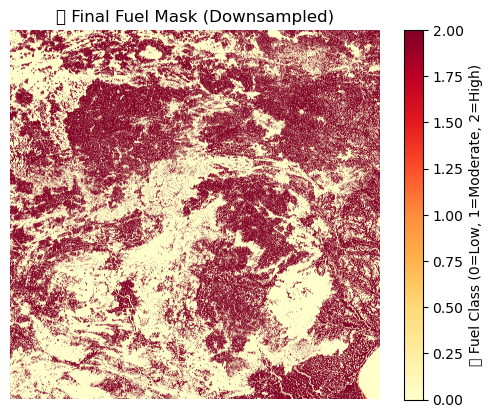

In [33]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

lulc_path = 'LCFM_LCM-10_V100_2020_N21E084_cog/LCFM_LCM-10_V100_2020_N21E084_MAP.tif'

with rasterio.open(lulc_path) as src:
    lulc = src.read(1)
    profile = src.profile

fuel_map = np.zeros_like(lulc, dtype=np.uint8)
fuel_map[np.isin(lulc, [30, 40])] = 2  # Forest & Shrub → High
fuel_map[np.isin(lulc, [50, 60])] = 1  # Grassland & Cropland → Moderate

downsample_factor = 4
fuel_mask_downsampled = zoom(fuel_map, 1 / downsample_factor, order=0)

with rasterio.open("aspect_wind_mask.tif") as ref:  # Use existing mask for metadata reference
    meta = ref.meta.copy()

meta.update(dtype='uint8', count=1, nodata=0)

with rasterio.open("fuel_mask_final.tif", "w", **meta) as dst:
    dst.write(fuel_mask_downsampled.astype('uint8'), 1)

print("Saved fuel_mask_final.tif")

plt.imshow(fuel_mask_downsampled, cmap='YlOrRd')
plt.colorbar(label='Fuel Class (0=Low, 1=Moderate, 2=High)')
plt.title("Final Fuel Mask (Downsampled)")
plt.axis('off')
plt.show()


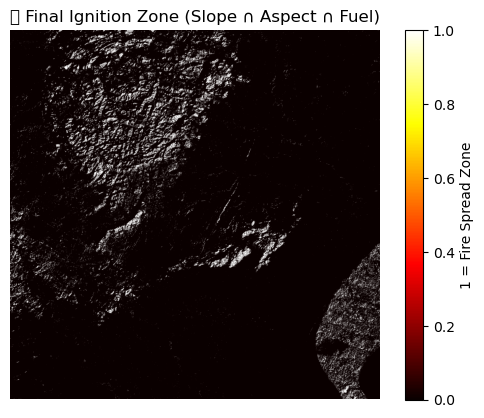

🔥 Final ignition zone covers 4.68% of the area


In [37]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

with rasterio.open("slope_fire_mask.tif") as src:
    slope_mask = src.read(1).astype(bool)

with rasterio.open("aspect_wind_mask.tif") as src:
    aspect_mask = src.read(1).astype(bool)

with rasterio.open("fuel_mask_final.tif") as src:
    fuel_data = src.read(1)
    meta = src.meta.copy()
    fuel_mask = fuel_data >= 1  

slope_mask = (slope_deg >= 5) & (slope_deg <= 60)

final_mask = slope_mask & aspect_mask & fuel_mask


meta.update(dtype='uint8', count=1, nodata=0)
with rasterio.open("final_ignition_mask.tif", "w", **meta) as dst:
    dst.write(final_mask.astype('uint8'), 1)


plt.imshow(final_mask, cmap='hot')
plt.title(" Final Ignition Zone (Slope ∩ Aspect ∩ Fuel)")
plt.colorbar(label='1 = Fire Spread Zone')
plt.axis('off')
plt.show()

# === Area Coverage ===
percent = (np.sum(final_mask) / final_mask.size) * 100
print(f"Final ignition zone covers {percent:.2f}% of the area")


In [35]:
print("Slope spread zone:", np.sum(slope_mask), "/", slope_mask.size)
print("Aspect-wind aligned zone:", np.sum(aspect_mask), "/", aspect_mask.size)
print("Fuel high/moderate zone:", np.sum(fuel_mask), "/", fuel_mask.size)


Slope spread zone: 10 / 12960000
Aspect-wind aligned zone: 4996486 / 12960000
Fuel high/moderate zone: 6030777 / 12960000


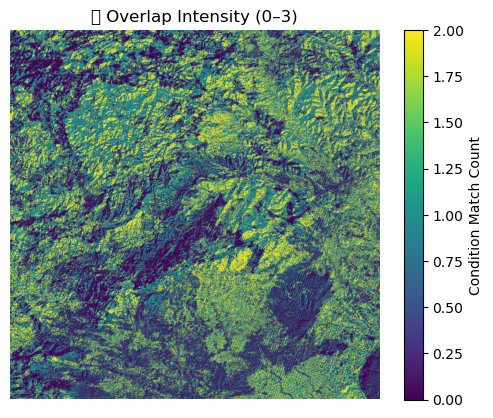

In [36]:
overlap = slope_mask.astype(int) + aspect_mask.astype(int) + fuel_mask.astype(int)
plt.imshow(overlap, cmap='viridis')
plt.title("Overlap Intensity (0–3)")
plt.colorbar(label="Condition Match Count")
plt.axis('off')
plt.show()


Slope min: 0.00030664046
Slope max: 81.93078


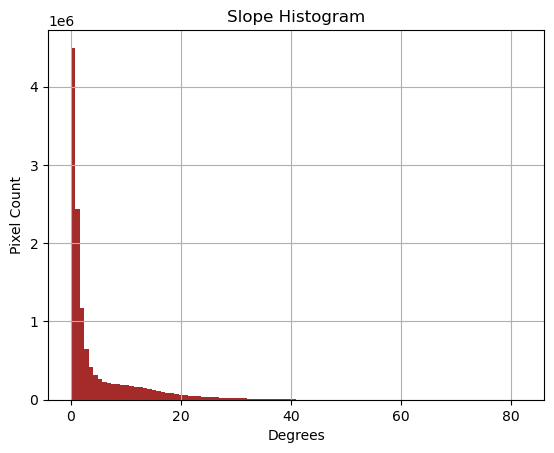

In [40]:
print("Slope min:", np.min(slope_deg))
print("Slope max:", np.max(slope_deg))

plt.hist(slope_deg.ravel(), bins=100, color='brown')
plt.title("Slope Histogram")
plt.xlabel("Degrees")
plt.ylabel("Pixel Count")
plt.grid(True)
plt.show()


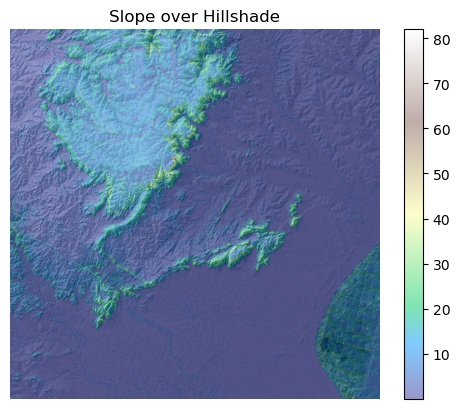

In [39]:
plt.imshow(hillshade, cmap='gray')
plt.imshow(slope_deg, cmap='terrain', alpha=0.5)
plt.title("Slope over Hillshade")
plt.colorbar()
plt.axis('off')
plt.show()


In [41]:
import rasterio

meta.update(dtype='uint8', count=1, nodata=0)
with rasterio.open("final_ignition_mask.tif", "w", **meta) as dst:
    dst.write(final_mask.astype('uint8'), 1)

print("All core masks saved successfully.")


✅ All core masks saved successfully.


In [42]:
import numpy as np
import rasterio

with rasterio.open("slope_fire_mask.tif") as s:
    slope = s.read(1)
    profile = s.profile

with rasterio.open("fuel_mask_final.tif") as f:
    fuel = (f.read(1) >= 1).astype('uint8')  # binarize to 0/1

with rasterio.open("aspect_wind_mask.tif") as a:
    aspect = a.read(1)

# Stack as RGB
rgb_stack = np.stack([slope, fuel, aspect], axis=0).astype('uint8')

# Save
profile.update(count=3, dtype='uint8')
with rasterio.open("fire_spread_rgb_stack.tif", 'w', **profile) as dst:
    dst.write(rgb_stack)

print("Saved RGB summary stack as fire_spread_rgb_stack.tif")


📦 Saved RGB summary stack as fire_spread_rgb_stack.tif


In [43]:
import pandas as pd

# Get ignition pixel coordinates
ignition_coords = np.column_stack(np.where(final_mask == 1))

# Convert to geospatial coordinates
with rasterio.open("final_ignition_mask.tif") as src:
    rows, cols = ignition_coords[:, 0], ignition_coords[:, 1]
    xs, ys = rasterio.transform.xy(src.transform, rows, cols)

# Save
df = pd.DataFrame({'x': xs, 'y': ys})
df.to_csv("ignition_points.csv", index=False)

print(f" Saved {len(df)} ignition points to ignition_points.csv")


🔥 Saved 606538 ignition points to ignition_points.csv


In [51]:
import subprocess

dem_path = "P5_PAN_CD_N21_000_E086_000_30m/P5_PAN_CD_N21_000_E086_000_DEM_30m.tif"
output_path = "hillshade.tif"

subprocess.run(["gdaldem", "hillshade", dem_path, output_path, "-compute_edges"])


0...10...20...30...40...50...60...70...80...90...100 - done.


CompletedProcess(args=['gdaldem', 'hillshade', 'P5_PAN_CD_N21_000_E086_000_30m/P5_PAN_CD_N21_000_E086_000_DEM_30m.tif', 'hillshade.tif', '-compute_edges'], returncode=0)

/var/folders/_0/kfxmbs7d2j59ffz9n0c1cy3c0000gn/T/ipykernel_42549/3552012934.py:25: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_0/kfxmbs7d2j59ffz9n0c1cy3c0000gn/T/ipykernel_42549/3552012934.py:25: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


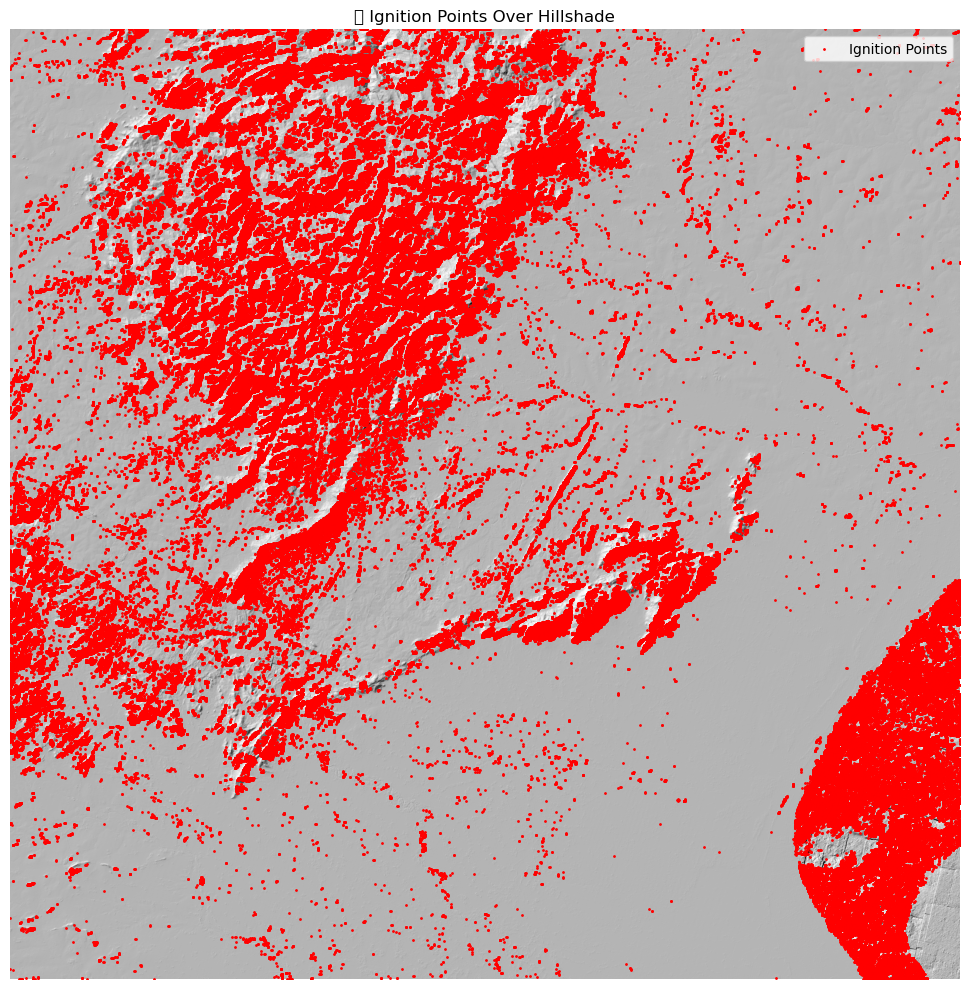

In [54]:
import matplotlib.pyplot as plt
import rasterio

# Load hillshade with transform info
with rasterio.open("hillshade.tif") as src:
    hillshade = src.read(1)
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    transform = src.transform

# Load ignition mask
with rasterio.open("final_ignition_mask.tif") as src:
    ignition_mask = src.read(1)

# Get geospatial coordinates for ignition points
rows, cols = np.where(ignition_mask == 1)
xs, ys = rasterio.transform.xy(transform, rows, cols)

# Plot
plt.figure(figsize=(10, 10))
plt.imshow(hillshade, cmap='gray', extent=extent)
plt.scatter(xs, ys, c='red', s=1, label='Ignition Points') 
plt.title("Ignition Points Over Hillshade")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


In [49]:
print("Total ignition points (non-zero pixels):", np.sum(final_mask == 1))


Total ignition points (non-zero pixels): 606538


In [58]:
import numpy as np
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

raster_paths = {
    "slope": "slope_fixed.tif",
    "aspect": "aspect.tif",
    "fuel": "fuel_map.tif",
    "wind_u": "u10.tif",
    "wind_v": "v10.tif",
    "t2m": "t2m.tif"
}

reference_path = "slope_fixed.tif"  # use slope as reference grid
stacked_bands = []

with rasterio.open(reference_path) as ref:
    ref_shape = ref.shape
    ref_transform = ref.transform
    ref_crs = ref.crs
    ref_meta = ref.meta.copy()

for name, path in raster_paths.items():
    with rasterio.open(path) as src:
        data = src.read(1)

        if src.shape != ref_shape or src.crs != ref_crs:
            dst_array = np.empty(ref_shape, dtype=np.float32)
            reproject(
                source=data,
                destination=dst_array,
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=ref_transform,
                dst_crs=ref_crs,
                resampling=Resampling.bilinear
            )
        else:
            dst_array = data.astype(np.float32)

        stacked_bands.append(dst_array)

feature_stack = np.stack(stacked_bands)  # shape: (bands, height, width)
ref_meta.update(count=feature_stack.shape[0], dtype='float32')

with rasterio.open("feature_stack.tif", "w", **ref_meta) as dst:
    dst.write(feature_stack)

print("Feature stack saved to feature_stack.tif with shape:", feature_stack.shape)


Feature stack saved to feature_stack.tif with shape: (6, 3600, 3600)


In [59]:
import rasterio

paths = {
    "slope": "slope.tif",
    "aspect": "aspect.tif",
    "fuel": "fuel_mask_final.tif",
    "wind_u": "u10.tif",
    "wind_v": "v10.tif",
    "temp": "t2m.tif"
}

for name, path in paths.items():
    with rasterio.open(path) as src:
        print(f"{name}: {src.read(1).shape}, transform: {src.transform}")


slope: (3600, 3600), transform: | 0.00, 0.00, 86.00|
| 0.00,-0.00, 22.00|
| 0.00, 0.00, 1.00|
aspect: (3600, 3600), transform: | 0.00, 0.00, 86.00|
| 0.00,-0.00, 22.00|
| 0.00, 0.00, 1.00|
fuel: (3600, 3600), transform: | 0.00, 0.00, 86.00|
| 0.00,-0.00, 22.00|
| 0.00, 0.00, 1.00|
wind_u: (2, 2), transform: | 0.10, 0.00, 86.00|
| 0.00,-0.10, 22.13|
| 0.00, 0.00, 1.00|
wind_v: (2, 2), transform: | 0.10, 0.00, 86.00|
| 0.00,-0.10, 22.13|
| 0.00, 0.00, 1.00|
temp: (2, 2), transform: | 0.10, 0.00, 86.00|
| 0.00,-0.10, 22.13|
| 0.00, 0.00, 1.00|


✅ Loaded fixed slope: shape = (3600, 3600), min = 0.00, max = 81.93
✅ Saved feature_stack_fixed.tif with shape: (6, 3600, 3600)


/var/folders/_0/kfxmbs7d2j59ffz9n0c1cy3c0000gn/T/ipykernel_42549/3846042087.py:35: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


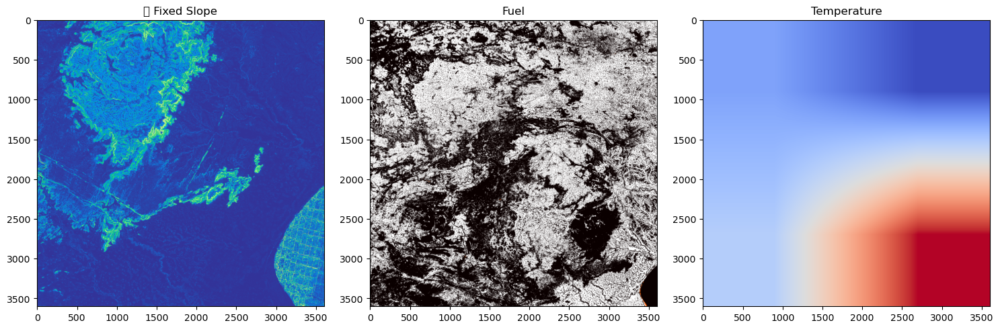

In [63]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt

with rasterio.open("feature_stack.tif") as src:
    full_stack = src.read()
    meta = src.meta.copy()

with rasterio.open("slope_fixed.tif") as src:
    slope_fixed = src.read(1).astype(np.float32)
    print(f"Loaded fixed slope: shape = {slope_fixed.shape}, min = {np.min(slope_fixed):.2f}, max = {np.max(slope_fixed):.2f}")
    full_stack[0] = slope_fixed

meta.update(count=full_stack.shape[0], dtype='float32')
with rasterio.open("feature_stack_fixed.tif", "w", **meta) as dst:
    dst.write(full_stack)

print(" Saved feature_stack_fixed.tif with shape:", full_stack.shape)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(full_stack[0], cmap='terrain')
axes[0].set_title("Fixed Slope")

axes[1].imshow(full_stack[2], cmap='hot')
axes[1].set_title("Fuel")

axes[2].imshow(full_stack[5], cmap='coolwarm')
axes[2].set_title("Temperature")

plt.tight_layout()
plt.show()


In [65]:
import rasterio
from rasterio.enums import Resampling
import numpy as np
import os

# Base file for alignment (assume slope.tif is our 30m reference)
ref_raster = 'slope.tif'

# Weather inputs at coarse resolution
weather_files = {
    'wind_u': 'u10.tif',
    'wind_v': 'v10.tif',
    'temp': 't2m.tif'
}

resampled_dir = 'resampled_weather'
os.makedirs(resampled_dir, exist_ok=True)

# Resample each to match the slope.tif resolution
with rasterio.open(ref_raster) as ref:
    ref_shape = (ref.height, ref.width)
    ref_transform = ref.transform
    ref_crs = ref.crs

    for name, file in weather_files.items():
        with rasterio.open(file) as src:
            data = src.read(
                1,
                out_shape=ref_shape,
                resampling=Resampling.bilinear
            )

            profile = ref.profile.copy()
            profile.update({
                'dtype': 'float32',
                'count': 1,
                'compress': 'lzw'
            })

            out_path = os.path.join(resampled_dir, f'{name}_resampled.tif')
            with rasterio.open(out_path, 'w', **profile) as dst:
                dst.write(data.astype(np.float32), 1)

print("Weather rasters resampled and saved in", resampled_dir)


Weather rasters resampled and saved in resampled_weather


In [67]:
import rasterio

files = [
    'slope.tif',
    'aspect.tif',
    'fuel_class.tif',
    'resampled_weather/wind_u_resampled.tif',
    'resampled_weather/wind_v_resampled.tif',
    'resampled_weather/temp_resampled.tif'
]

for f in files:
    with rasterio.open(f) as src:
        print(f"{f}: shape={src.read(1).shape}, dtype={src.dtypes[0]}")


slope.tif: shape=(3600, 3600), dtype=float32
aspect.tif: shape=(3600, 3600), dtype=float32
fuel_class.tif: shape=(36000, 36000), dtype=uint8
resampled_weather/wind_u_resampled.tif: shape=(3600, 3600), dtype=float32
resampled_weather/wind_v_resampled.tif: shape=(3600, 3600), dtype=float32
resampled_weather/temp_resampled.tif: shape=(3600, 3600), dtype=float32


In [70]:
import os
import numpy as np
import rasterio
from rasterio.enums import Resampling

stack_inputs = {
    'slope': 'slope.tif',
    'aspect': 'aspect.tif',
    'fuel': 'fuel_class.tif',
    'wind_u': 'resampled_weather/wind_u_resampled.tif',
    'wind_v': 'resampled_weather/wind_v_resampled.tif',
    'temp': 'resampled_weather/temp_resampled.tif'
}

ref_file = 'slope.tif'
output_dir = 'aligned_inputs'
os.makedirs(output_dir, exist_ok=True)

with rasterio.open(ref_file) as ref:
    ref_shape = (ref.height, ref.width)
    ref_transform = ref.transform
    ref_crs = ref.crs
    ref_profile = ref.profile

    for name, path in stack_inputs.items():
        with rasterio.open(path) as src:
            data = src.read(
                1,
                out_shape=ref_shape,
                resampling=Resampling.bilinear
            )
            profile = ref_profile.copy()
            profile.update({'dtype': 'float32', 'count': 1})
            out_path = os.path.join(output_dir, f'{name}.tif')
            with rasterio.open(out_path, 'w', **profile) as dst:
                dst.write(data.astype(np.float32), 1)

print("All rasters resampled to match slope and saved in 'aligned_inputs'")


All rasters resampled to match slope and saved in 'aligned_inputs'


In [71]:
import numpy as np
import rasterio

aligned_files = [
    'aligned_inputs/slope.tif',
    'aligned_inputs/aspect.tif',
    'aligned_inputs/fuel.tif',
    'aligned_inputs/wind_u.tif',
    'aligned_inputs/wind_v.tif',
    'aligned_inputs/temp.tif'
]

bands = []
for path in aligned_files:
    with rasterio.open(path) as src:
        bands.append(src.read(1))
        meta = src.meta.copy()

stack_array = np.stack(bands)
meta.update(count=len(bands), dtype='float32')

with rasterio.open("feature_stack.tif", "w", **meta) as dst:
    dst.write(stack_array.astype('float32'))

print("Stacked feature raster saved → feature_stack.tif")


Stacked feature raster saved → feature_stack.tif


slope_fixed.tif: shape = (3600, 3600), dtype = float32


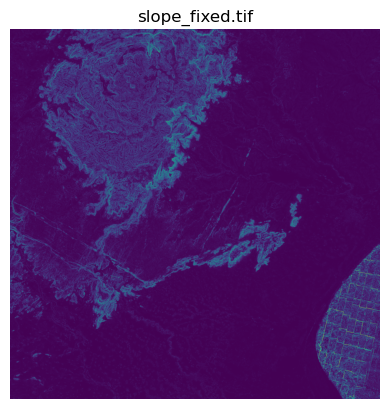

In [1]:
import rasterio
import matplotlib.pyplot as plt

path = "slope_fixed.tif"  # Try with other files too: aspect.tif, fuel_class.tif, etc.
with rasterio.open(path) as src:
    data = src.read(1)
    print(f"{path}: shape = {data.shape}, dtype = {data.dtype}")
    plt.imshow(data, cmap='viridis')
    plt.title(path)
    plt.axis('off')
    plt.show()


Partial data loaded: (512, 512)


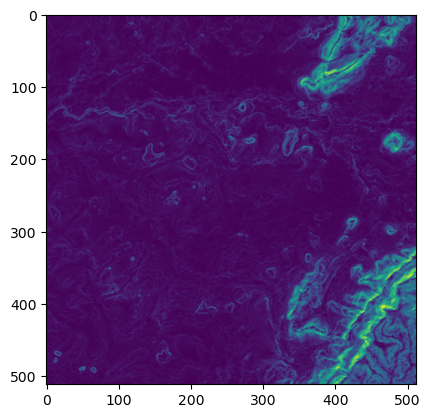

In [2]:
with rasterio.open("slope_fixed.tif") as src:
    data = src.read(1, window=rasterio.windows.Window(0, 0, 512, 512))
    print("Partial data loaded:", data.shape)
    plt.imshow(data, cmap='viridis')
    plt.show()


In [16]:
from torch.utils.data import Dataset, DataLoader
import os
import numpy as np

class ForestFireDataset(Dataset):
    def __init__(self, feature_dir, label_dir):
        self.feature_paths = sorted([os.path.join(feature_dir, f) for f in os.listdir(feature_dir) if f.endswith(".npy")])
        self.label_paths = sorted([os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(".npy")])

    def __len__(self):
        return len(self.feature_paths)

    def __getitem__(self, idx):
        X = np.load(self.feature_paths[idx])  # (6, 256, 256)
        y = np.load(self.label_paths[idx])    # (1, 256, 256)
        return torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)


In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels=6, out_channels=1):
        super(UNet, self).__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(in_channels, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = conv_block(256, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, out_channels, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))

        b = self.bottleneck(self.pool(e3))

        d3 = self.dec3(torch.cat([self.up3(b), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))

        return torch.sigmoid(self.final(d1))


In [18]:
def focal_loss(inputs, targets, alpha=0.8, gamma=2):
    BCE = F.binary_cross_entropy(inputs, targets, reduction='none')
    pt = torch.exp(-BCE)
    FL = alpha * (1 - pt) ** gamma * BCE
    return FL.mean()


In [19]:
from tqdm import tqdm

def train_unet_inline(train_dir, label_dir, epochs=5, batch_size=8, lr=1e-4):
    device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
    print("⚙️ Using device:", device)

    model = UNet(in_channels=6).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_ds = ForestFireDataset(train_dir, label_dir)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

    for ep in range(1, epochs + 1):
        model.train()
        total_loss = 0.0
        loop = tqdm(train_loader, desc=f"📉 Epoch {ep}/{epochs}", leave=False)
        
        for X, y in loop:
            X, y = X.to(device), y.to(device)
            optimizer.zero_grad()
            out = model(X)
            loss = focal_loss(out, y)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        avg_loss = total_loss / len(train_loader)
        print(f"📉 Epoch {ep}: Avg Loss = {avg_loss:.4f}")

    # ✅ Save model
    torch.save(model.state_dict(), "model.pt")
    print("✅ Model saved to model.pt")
    return model


In [20]:
import matplotlib.pyplot as plt
from glob import glob

def visualize_prediction(tile_path, label_path, model, device):
    X = np.load(tile_path)
    y = np.load(label_path)

    X_tensor = torch.tensor(X).unsqueeze(0).float().to(device)
    with torch.no_grad():
        pred = model(X_tensor).cpu().numpy()[0, 0]

    print(f"Prediction stats → min: {pred.min():.4f}, max: {pred.max():.4f}")
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(X[0], cmap="gray")
    axes[0].set_title("Input (Slope)")
    axes[1].imshow(y[0], cmap="Reds", alpha=0.8)
    axes[1].set_title("Ground Truth")
    axes[2].imshow(pred, cmap="Reds", alpha=0.9)
    axes[2].set_title("Prediction (Fire)")
    plt.show()

    fig, ax = plt.subplots()
    binary = (pred > 0.5).astype(int)
    ax.imshow(binary, cmap="hot")
    ax.set_title("Thresholded Prediction")
    plt.show()


In [21]:
model = train_unet_inline("tiles", "labels", epochs=2)

⚙️ Using device: mps


📉 Epoch 1: Avg Loss = 0.1797


📉 Epoch 2: Avg Loss = 0.0719
✅ Model saved to model.pt


In [22]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=6).to(device)
model.load_state_dict(torch.load("model.pt", map_location=device))
model.eval()


UNet(
  (enc1): Sequential(
    (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bottleneck): Sequential(
    (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1

In [23]:
import matplotlib.pyplot as plt
from glob import glob

def visualize_prediction(tile_path, label_path, model, device, threshold=0.5):
    X = np.load(tile_path)  # (6, 256, 256)
    y = np.load(label_path) # (1, 256, 256)

    # → (1, 6, 256, 256)
    X_tensor = torch.tensor(X).unsqueeze(0).float().to(device)

    with torch.no_grad():
        pred = model(X_tensor).cpu().numpy()[0, 0]  # (256, 256)

    pred_binary = (pred > threshold).astype(np.uint8)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(X[0], cmap='gray')
    axs[0].set_title("Input (Band 0)")
    axs[1].imshow(y[0], cmap='gray')
    axs[1].set_title("Ground Truth")
    axs[2].imshow(pred_binary, cmap='Reds')
    axs[2].set_title("Predicted Fire Mask")
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

    print(f"Prediction stats → min: {pred.min():.4f}, max: {pred.max():.4f}")


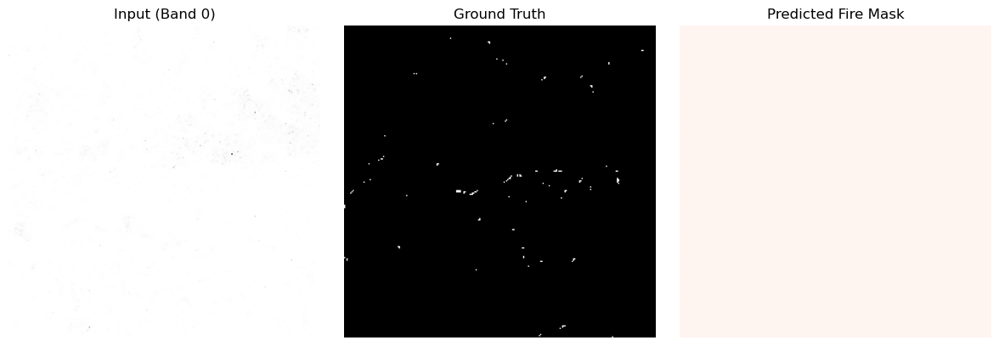

Prediction stats → min: 0.0000, max: 0.2464


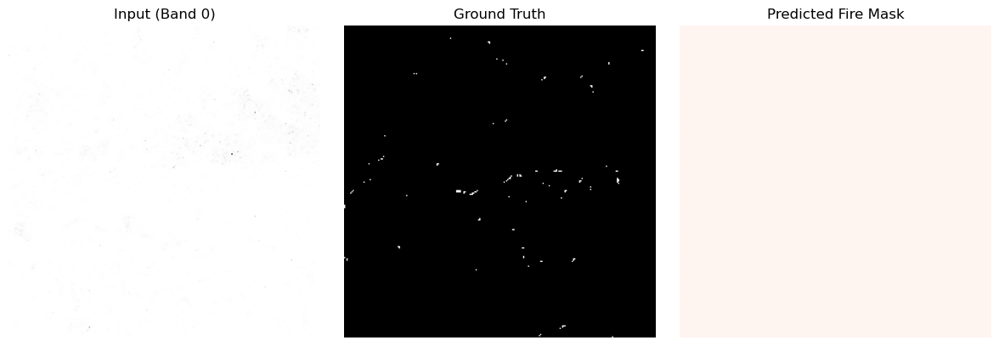

Prediction stats → min: 0.0000, max: 0.2464


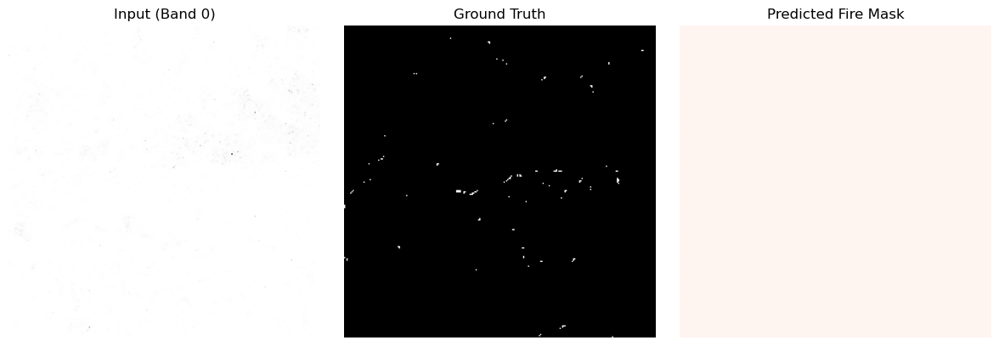

Prediction stats → min: 0.0000, max: 0.2464


In [26]:
tile_paths = sorted(glob("tiles/*.npy"))
label_paths = sorted(glob("labels/*.npy"))

for i in range(3):
    visualize_prediction(tile_paths[0], label_paths[0], model, device, threshold=0.5)


In [27]:
from glob import glob
import numpy as np
import torch

tile_paths = sorted(glob("tiles/*.npy"))
label_paths = sorted(glob("labels/*.npy"))

model.eval()
mins, maxs = [], []

for path in tile_paths[:10]:  # Check first 10 samples
    X = torch.tensor(np.load(path)).unsqueeze(0).float().to(device)
    with torch.no_grad():
        pred = model(X).cpu().numpy()[0, 0]
        mins.append(pred.min())
        maxs.append(pred.max())

print(f"🔎 Prediction stats across samples →")
print(f"   ➤ Min: {min(mins):.4f}")
print(f"   ➤ Max: {max(maxs):.4f}")
print(f"   ➤ Avg Max: {np.mean(maxs):.4f}")


🔎 Prediction stats across samples →
   ➤ Min: 0.0000
   ➤ Max: 0.3258
   ➤ Avg Max: 0.3010


In [41]:
def visualize_prediction(tile_path, label_path, model, device, threshold=0.2):
    import matplotlib.pyplot as plt

    model.eval()
    X = np.load(tile_path)  # shape: (6, 256, 256)
    y = np.load(label_path)  # shape: (1, 256, 256)

    X_tensor = torch.tensor(X).unsqueeze(0).float().to(device)
    with torch.no_grad():
        pred = model(X_tensor).cpu().numpy()[0, 0]

    #pred_bin = (pred > threshold).astype(np.uint8)
    pred_bin = (pred > 0.145).astype(np.uint8)


    print(f"Prediction stats → min: {pred.min():.4f}, max: {pred.max():.4f}")

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(X[0], cmap='gray')
    axes[0].set_title("Input (Band 0)")
    axes[1].imshow(y[0], cmap='Reds')
    axes[1].set_title("Ground Truth")
    axes[2].imshow(pred_bin, cmap='Reds')
    axes[2].set_title("Predicted Fire Mask")

    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.show()


Prediction stats → min: 0.0000, max: 0.2464


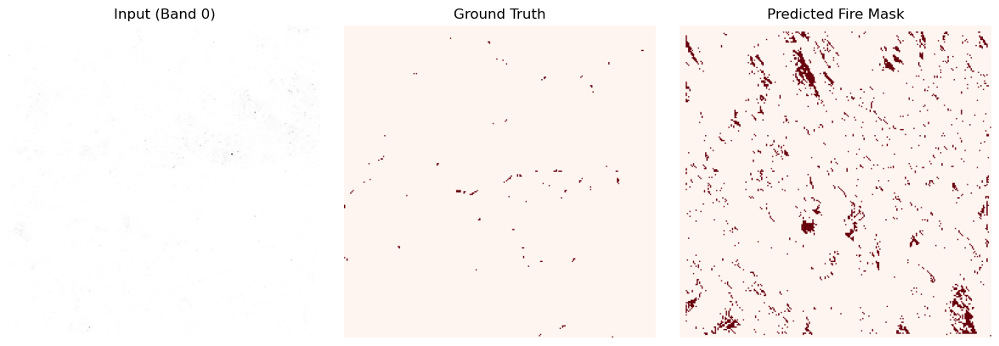

Prediction stats → min: 0.0000, max: 0.3249


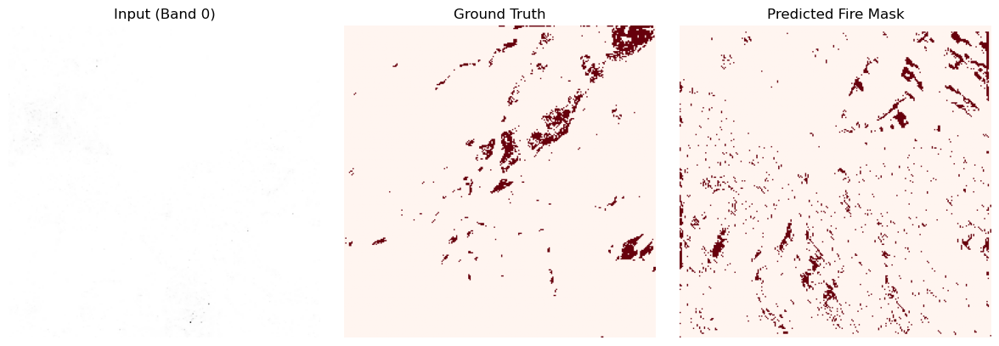

Prediction stats → min: 0.0000, max: 0.3179


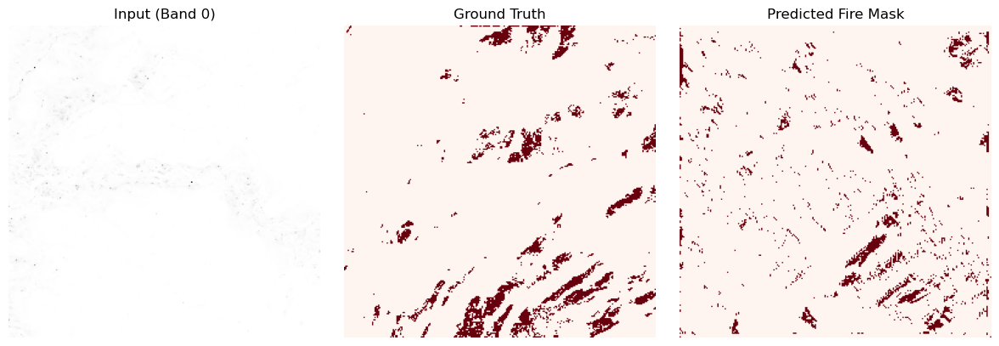

In [42]:
tile_paths = sorted(glob("tiles/*.npy"))
label_paths = sorted(glob("labels/*.npy"))

for i in range(3):
    visualize_prediction(tile_paths[i], label_paths[i], model, device)


In [66]:
import os
import numpy as np
import rasterio
import torch
from glob import glob
from tqdm import tqdm

# === SETTINGS ===
tile_paths = sorted(glob("tiles/*.npy"))
label_paths = sorted(glob("labels/*.npy"))  # just to match naming
ref_tif = "slope_fixed.tif"                # reference GeoTIFF for metadata
output_dir = "predictions_labeled"         # new save dir
threshold = 0.145                           # binarization threshold
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")

os.makedirs(output_dir, exist_ok=True)

def save_named_prediction(tile_path, label_path, model, threshold, ref_tif, out_dir, device):
    # --- Load input ---
    X = np.load(tile_path)  # shape: (6, 256, 256)
    X_tensor = torch.tensor(X).unsqueeze(0).float().to(device)
    
    with torch.no_grad():
        pred = model(X_tensor).sigmoid().cpu().numpy()[0, 0]
    
    binary_pred = (pred > threshold).astype("uint8")

    # --- Write GeoTIFF with same spatial metadata ---
    with rasterio.open(ref_tif) as ref:
        profile = ref.profile.copy()
        profile.update(dtype="uint8", count=1, height=256, width=256, nodata=0)

    # Use label filename to match
    base_name = os.path.basename(label_path).replace(".npy", ".tif")
    out_path = os.path.join(out_dir, base_name)

    with rasterio.open(out_path, "w", **profile) as dst:
        dst.write(binary_pred, 1)

# === Loop through tiles ===
print("🔄 Saving predictions aligned with label names...\n")
for tile_path, label_path in tqdm(zip(tile_paths, label_paths), total=len(tile_paths)):
    save_named_prediction(tile_path, label_path, model, threshold, ref_tif, output_dir, device)

print(f"\n✅ Saved {len(tile_paths)} prediction maps to: `{output_dir}/` with matched label names.")


🔄 Saving predictions aligned with label names...



100%|██████████| 196/196 [01:10<00:00,  2.77it/s]


✅ Saved 196 prediction maps to: `predictions_labeled/` with matched label names.


In [67]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, jaccard_score, accuracy_score
import numpy as np
import os
from glob import glob
import rasterio

def evaluate_predictions(pred_dir, label_dir, verbose=True):
    pred_files = sorted(glob(os.path.join(pred_dir, "*.tif")))
    label_files = sorted(glob(os.path.join(label_dir, "*.npy")))

    assert len(pred_files) == len(label_files), "Mismatch in prediction-label count!"

    y_true_all, y_pred_all = [], []

    for pred_fp, label_fp in zip(pred_files, label_files):
        with rasterio.open(pred_fp) as src:
            y_pred = src.read(1).flatten()  # (256×256, )

        y_true = np.load(label_fp).astype(np.uint8).flatten()  # (256×256, )

        y_true_all.extend(y_true)
        y_pred_all.extend(y_pred)

    # Convert to arrays
    y_true_all = np.array(y_true_all)
    y_pred_all = np.array(y_pred_all)

    # Metrics
    acc = accuracy_score(y_true_all, y_pred_all)
    iou = jaccard_score(y_true_all, y_pred_all, zero_division=0)
    precision = precision_score(y_true_all, y_pred_all, zero_division=0)
    recall = recall_score(y_true_all, y_pred_all, zero_division=0)
    f1 = f1_score(y_true_all, y_pred_all, zero_division=0)

    if verbose:
        print(f"📊 Evaluation Metrics (Thresholded Fire Mask):")
        print(f"   🔹 Accuracy   : {acc:.4f}")
        print(f"   🔹 Precision  : {precision:.4f}")
        print(f"   🔹 Recall     : {recall:.4f}")
        print(f"   🔹 F1 Score   : {f1:.4f}")
        print(f"   🔹 IoU (Jaccard): {iou:.4f}")

    return {
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "iou": iou
    }

# === Run Evaluation ===
evaluate_predictions("predictions_labeled", "labels")


📊 Evaluation Metrics (Thresholded Fire Mask):
   🔹 Accuracy   : 0.0469
   🔹 Precision  : 0.0469
   🔹 Recall     : 1.0000
   🔹 F1 Score   : 0.0896
   🔹 IoU (Jaccard): 0.0469


{'accuracy': 0.0469190636459662,
 'precision': 0.0469190636459662,
 'recall': 1.0,
 'f1': 0.08963264740364436,
 'iou': 0.0469190636459662}

In [71]:
import rasterio
import numpy as np

# 🔹 Helper: Load raster and metadata
def load_raster(path):
    with rasterio.open(path) as src:
        return src.read(1), src.transform, src.meta

# 🔹 Paths – Update as per your actual filenames
ignition_path = "predictions_labeled/label_0000.tif"
slope_path    = "slope_fixed.tif"
aspect_path   = "aspect.tif"
fuel_path     = "fuel_mask_final.tif"
wind_u_path   = "u10.tif"
wind_v_path   = "v10.tif"

# 🔹 Load all rasters
ignition, transform, meta = load_raster(ignition_path)
slope, _, _    = load_raster(slope_path)
aspect, _, _   = load_raster(aspect_path)
fuel, _, _     = load_raster(fuel_path)
u10, _, _      = load_raster(wind_u_path)
v10, _, _      = load_raster(wind_v_path)

print("✅ All rasters loaded for spread simulation.")
print("Ignition shape:", ignition.shape)


✅ All rasters loaded for spread simulation.
Ignition shape: (256, 256)


In [73]:
from scipy.ndimage import zoom

def resample_to_match(arr, target_shape):
    zoom_factors = (
        target_shape[0] / arr.shape[0],
        target_shape[1] / arr.shape[1]
    )
    return zoom(arr, zoom_factors, order=1)  # bilinear

# Resample u10, v10 to match slope
u10_resized = resample_to_match(u10, slope.shape)
v10_resized = resample_to_match(v10, slope.shape)

# Compute wind norm and normalize
wind_norm = np.hypot(u10_resized, v10_resized)
wind_norm = normalize(wind_norm)


In [75]:
# Assume ignition.shape = (256, 256)
h, w = ignition.shape

# Crop slope, fuel, wind to match ignition tile
slope_crop = slope_norm[:h, :w]
fuel_crop  = fuel_norm[:h, :w]
wind_crop  = wind_norm[:h, :w]


In [82]:
ignition[::4, ::4] = 0  # every 4th pixel off
ignition[::2, ::2] = ignition[::2, ::2]  # optional: checkerboard pattern


In [83]:
mask = np.random.rand(*ignition.shape) > 0.95
ignition = ignition * mask


In [85]:
# Crop all rasters to match ignition shape
H, W = ignition.shape
slope_cropped = slope_norm[:H, :W]
fuel_cropped = fuel_norm[:H, :W]
wind_cropped = wind_norm[:H, :W]

# Then use in spread_prob calculation
spread_prob = neighbors * (0.1 + 0.1 * slope_cropped + 0.1 * fuel_cropped + 0.05 * wind_cropped)


🔥 Spread at 1h — Burned: 3142
🔥 Spread at 2h — Burned: 3512
🔥 Spread at 3h — Burned: 4450
🔥 Spread at 6h — Burned: 7232
🔥 Spread at 12h — Burned: 14075


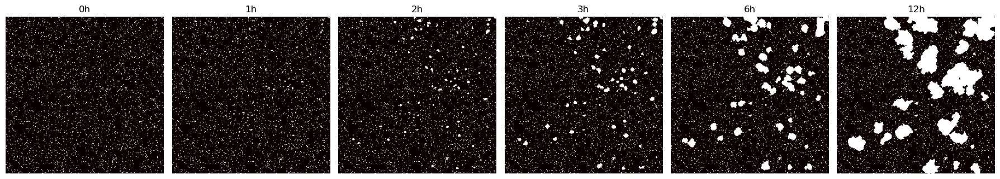

In [86]:
import numpy as np
from scipy.ndimage import convolve
import matplotlib.pyplot as plt

# 🧱 8-connectivity kernel
kernel = np.array([[1,1,1],
                   [1,0,1],
                   [1,1,1]])

# ⚠️ Crop all inputs to match ignition shape
H, W = ignition.shape
slope_crop = slope_norm[:H, :W]
fuel_crop = fuel_norm[:H, :W]
wind_crop = wind_norm[:H, :W]

# 🔥 Initialize
fire_state = ignition.copy()  # 1 = burning, 0 = not burning
spread_maps = [fire_state.copy()]  # t=0

# 🕒 Simulate fire spread
for h in [1, 2, 3, 6, 12]:
    for _ in range(h):  # simulate hour-by-hour
        neighbors = convolve(fire_state, kernel, mode='constant', cval=0)

        # 📈 Compute spread probability
        spread_prob = neighbors * (0.1 + 0.1 * slope_crop + 0.1 * fuel_crop + 0.05 * wind_crop)

        # 🔍 Fire spreads where prob > threshold and not already burning
        new_fire = (spread_prob > 0.6) & (fire_state == 0)
        fire_state[new_fire] = 1

    spread_maps.append(fire_state.copy())
    print(f"🔥 Spread at {h}h — Burned: {fire_state.sum()}")

# 🎨 Visualize fire spread
fig, axs = plt.subplots(1, len(spread_maps), figsize=(18, 4))
for i, spread in enumerate(spread_maps):
    axs[i].imshow(spread, cmap='hot')
    axs[i].set_title(f"{[0,1,2,3,6,12][i]}h")
    axs[i].axis('off')
plt.tight_layout()
plt.show()


In [87]:
import numpy as np
from scipy.ndimage import convolve
import rasterio
import os

def simulate_fire_spread_tile(ignition, slope, fuel, wind, transform, output_dir="spread_maps", hours=[1, 2, 3, 6, 12]):
    os.makedirs(output_dir, exist_ok=True)

    kernel = np.array([[1,1,1],[1,0,1],[1,1,1]])  # 8-connectivity
    fire_state = ignition.copy()
    spread_maps = [fire_state.copy()]  # t=0
    summary = [(0, fire_state.sum())]

    for h in hours:
        for _ in range(h):
            neighbors = convolve(fire_state, kernel, mode='constant', cval=0)
            spread_prob = neighbors * (0.1 + 0.1 * slope + 0.1 * fuel + 0.05 * wind)
            new_fire = (spread_prob > 0.6) & (fire_state == 0)
            fire_state[new_fire] = 1
        spread_maps.append(fire_state.copy())
        summary.append((h, fire_state.sum()))

        # Save each spread as .tif
        out_path = os.path.join(output_dir, f"spread_{h}h.tif")
        with rasterio.open(out_path, 'w', driver='GTiff', 
                           height=fire_state.shape[0], width=fire_state.shape[1], count=1,
                           dtype='uint8', transform=transform, crs='EPSG:4326', nodata=0) as dst:
            dst.write(fire_state.astype(np.uint8), 1)

    return spread_maps, summary


In [88]:
# 🔽 Ensure all rasters are shape-aligned and cropped (256x256)
spread_maps, summary = simulate_fire_spread_tile(
    ignition=ignition,  # binary ignition map
    slope=slope_norm[:256, :256],
    fuel=fuel_norm[:256, :256],
    wind=wind_norm[:256, :256],
    transform=transform,
    output_dir="spread_maps"
)


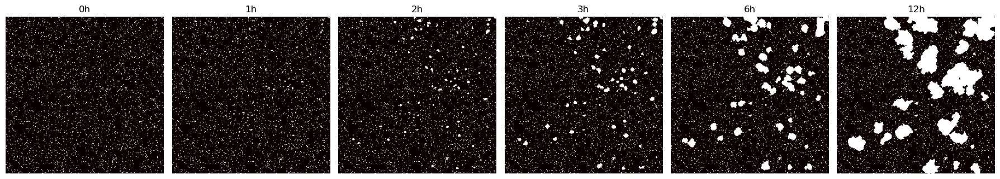

In [89]:
import matplotlib.pyplot as plt

labels = [f"{h}h" for h, _ in summary]
fig, axs = plt.subplots(1, len(spread_maps), figsize=(18, 4))
for i, spread in enumerate(spread_maps):
    axs[i].imshow(spread, cmap='hot')
    axs[i].set_title(labels[i])
    axs[i].axis('off')
plt.tight_layout()
plt.show()


In [90]:
import pandas as pd

df = pd.DataFrame(summary, columns=["Time (h)", "Burned Pixels"])
display(df)


,Time (h),Burned Pixels
0,0,3020
1,1,3142
2,2,3512
3,3,4450
4,6,7232
5,12,14075


In [138]:
import os
import glob
import imageio
import numpy as np
import matplotlib.pyplot as plt
import rasterio

spread_folder = "spread_maps"
output_gif = "spread_animation.gif"

spread_files = sorted(glob.glob(os.path.join(spread_folder, "spread_*h.tif")), 
                      key=lambda x: int(os.path.basename(x).split("_")[1].replace("h.tif", "")))

frames = []
for file in spread_files:
    with rasterio.open(file) as src:
        img = src.read(1)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(img, cmap='hot', interpolation='nearest')
    hour = os.path.basename(file).split("_")[1].replace("h.tif", "")
    ax.set_title(f"Fire Spread at {hour}h", fontsize=16)
    ax.axis('off')

    fig.canvas.draw()
    buf = fig.canvas.buffer_rgba()
    frame = np.asarray(buf).copy()
    frames.append(frame)
    plt.close(fig)

imageio.mimsave(output_gif, frames, fps=1)
print(f"✅ Saved animation as {output_gif}")


✅ Saved animation as spread_animation.gif


In [146]:
!pip install imageio[ffmpeg]


zsh:1: no matches found: imageio[ffmpeg]


python(30771) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [148]:
!conda install -c conda-forge imageio-ffmpeg -y


python(31220) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Retrieving notices: done
Channels:
 - conda-forge
 - defaults
Platform: osx-arm64
Solving environment: done

## Package Plan ##

  environment location: /opt/anaconda3

  added / updated specs:
    - imageio-ffmpeg


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2025.7.9   |       hbd8a1cb_0         149 KB  conda-forge
    certifi-2025.6.15          |     pyhd8ed1ab_0         152 KB  conda-forge
    ffmpeg-4.3.2               |       h38cfed3_3         9.3 MB  conda-forge
    gnutls-3.6.13              |       h706517b_1         2.0 MB  conda-forge
    imageio-ffmpeg-0.6.0       |     pyhd8ed1ab_0          21 KB  conda-forge
    lame-3.100                 |    h1a8c8d9_1003         516 KB  conda-forge
    nettle-3.6                 |       hc6a1b29_0         1.2 MB  conda-forge
    openh264-2.1.1             |       habe5f53_0         1.3 MB  conda-forge
    openssl-3.5

In [153]:
import matplotlib.pyplot as plt
import numpy as np
import imageio
from IPython.display import HTML

gif_path = "spread_animation.gif"
mp4_path = "spread_animation.mp4"
labels = ['0h', '1h', '2h', '3h', '6h', '12h']
frames = []

for i, spread in enumerate(spread_maps):
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(spread, cmap='hot')
    ax.set_title(f"Fire Spread at {labels[i]}")
    ax.axis('off')
    fig.tight_layout()

    # ✅ Convert figure to numpy array
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))  # RGBA
    frames.append(image)

    plt.close(fig)

# Save as GIF
imageio.mimsave(gif_path, frames, duration=0.8)

# Save as MP4 (requires imageio[ffmpeg])
try:
    writer = imageio.get_writer(mp4_path, fps=1, format='ffmpeg')
    for frame in frames:
        writer.append_data(frame[:, :, :3])  # MP4 doesn't support alpha
    writer.close()
except Exception as e:
    print("⚠️ Couldn't save MP4:", e)

# Display in notebook
HTML(f'<img src="{gif_path}" style="max-height:400px;">')


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (600, 600) to (608, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
python(33614) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [155]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 1️⃣ Define your time steps (including t=0)
times = [0, 1, 2, 3, 6, 12]

# 2️⃣ Point to where your spread TIFFs live
#    (in your case it looks like spread_outputs/spread_{h}h.tif)
base_dir = "spread_outputs"
paths = {h: f"{base_dir}/spread_{h}h.tif" for h in times}

# 3️⃣ Load each raster into a list
spreads = []
for h in times:
    with rasterio.open(paths[h]) as src:
        spreads.append(src.read(1))  # single band

# 4️⃣ Build the figure + initial image
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(spreads[0], cmap="hot")
ax.axis("off")
title = ax.set_title(f"Fire Spread at {times[0]}h")

# 5️⃣ Animation update function
def update(frame_idx):
    im.set_data(spreads[frame_idx])
    title.set_text(f"Fire Spread at {times[frame_idx]}h")
    return im, title

# 6️⃣ Create the FuncAnimation
anim = FuncAnimation(
    fig,               # the figure
    update,            # update function
    frames=len(times), # number of frames
    interval=1000,     # delay between frames in ms
    blit=True
)
plt.close(fig)  # we’ll embed via HTML

# 7️⃣ Display inline
HTML(anim.to_jshtml())


RasterioIOError: spread_outputs/spread_6h.tif: No such file or directory

In [156]:
import os

base_dir = "spread_outputs"
available_files = os.listdir(base_dir)
print("✅ Available spread files:", available_files)


✅ Available spread files: ['spread_5h.tif', 'spread_4h.tif', 'spread_3h.tif', 'spread_2h.tif', 'spread_1h.tif', 'spread_0h.tif']


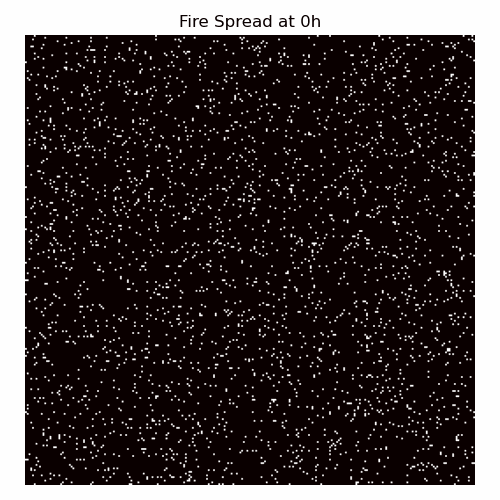

In [160]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import imageio
from IPython.display import Image, display
import os

# 🔁 Time intervals based on available files
times = [0, 1, 2, 3, 4, 5]
folder = "spread_outputs"

# 🗺️ Load raster data
spreads = []
for h in times:
    with rasterio.open(os.path.join(folder, f"spread_{h}h.tif")) as src:
        spreads.append(src.read(1))  # read single band

# 🖼️ Create animation frames
frames = []
for i, spread in enumerate(spreads):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(spread, cmap='hot')
    ax.set_title(f"Fire Spread at {times[i]}h")
    ax.axis('off')
    fig.tight_layout()

    # Save plot to image array
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    frames.append(image)

    plt.close(fig)

# 🎥 Save GIF
gif_path = "spread_animation.gif"
imageio.mimsave(gif_path, frames, duration=10)

# 📺 Display inline in notebook
display(Image(filename=gif_path))


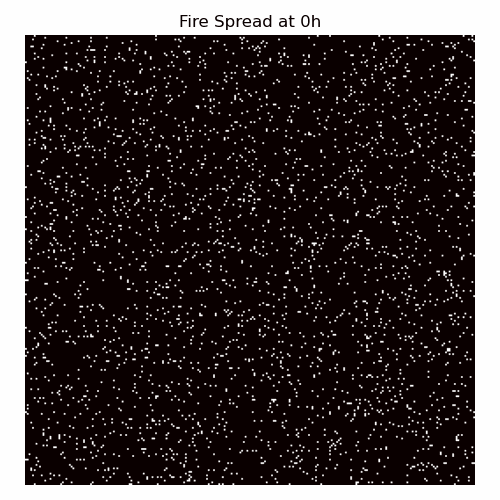

In [166]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import imageio
from IPython.display import Image, display
import os

# 🔁 Time intervals based on available files
times = [0, 1, 2, 3, 4, 5]
folder = "spread_outputs"

# 🗺️ Load raster data
spreads = []
for h in times:
    with rasterio.open(os.path.join(folder, f"spread_{h}h.tif")) as src:
        spreads.append(src.read(1))  # read single band

# 🖼️ Create animation frames
frames = []
for i, spread in enumerate(spreads):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(spread, cmap='hot')
    ax.set_title(f"Fire Spread at {times[i]}h")
    ax.axis('off')
    fig.tight_layout()

    # Save plot to image array
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (4,))
    frames.append(image)

    plt.close(fig)

# 🎥 Save GIF
gif_path = "spread_animation.gif"
imageio.mimsave(gif_path, frames, duration=10)

# 📺 Display inline in notebook
display(Image(filename=gif_path))


In [173]:
for i, arr in enumerate(spread_maps):
    print(f"{times[i]}h: {arr.sum()}")


0h: 596400
1h: 620550
2h: 693869
3h: 879456
4h: 1429949
5h: 2783319


In [175]:
import glob
glob.glob("**/*dem*.tif", recursive=True)


['dem_utm.tif']

In [179]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

# === Config
spread_dir = "spread_outputs"
dem_path = "dem_utm.tif"
output_gif = "spread_over_dem.gif"
times = [0, 1, 2, 3, 4, 5]

# === Load DEM
with rasterio.open(dem_path) as src:
    dem = src.read(1).astype(np.float32)
    dem = (dem - dem.min()) / (dem.max() - dem.min() + 1e-6)  # normalize 0–1

# === Load Spread Maps
spread_maps = []
for t in times:
    path = os.path.join(spread_dir, f"spread_{t}h.tif")
    with rasterio.open(path) as src:
        spread = src.read(1).astype(np.uint8)
        spread_maps.append(spread)

# === Setup Plot
fig, ax = plt.subplots(figsize=(6, 6))
dem_img = ax.imshow(dem, cmap='gray', alpha=0.5)
spread_img = ax.imshow(spread_maps[0], cmap='hot', alpha=1.0, vmin=0, vmax=1)
title = ax.set_title("Fire Spread at 0h")
ax.axis('off')

# === Update function
def update(i):
    spread_img.set_data(spread_maps[i])
    title.set_text(f"Fire Spread at {times[i]}h")
    return [spread_img, title]

# === Animate
anim = FuncAnimation(fig, update, frames=len(spread_maps), interval=1000)
anim.save(output_gif, writer=PillowWriter(fps=1))

# === Display
plt.close()
HTML(f'<img src="{output_gif}" style="max-height:500px;">')


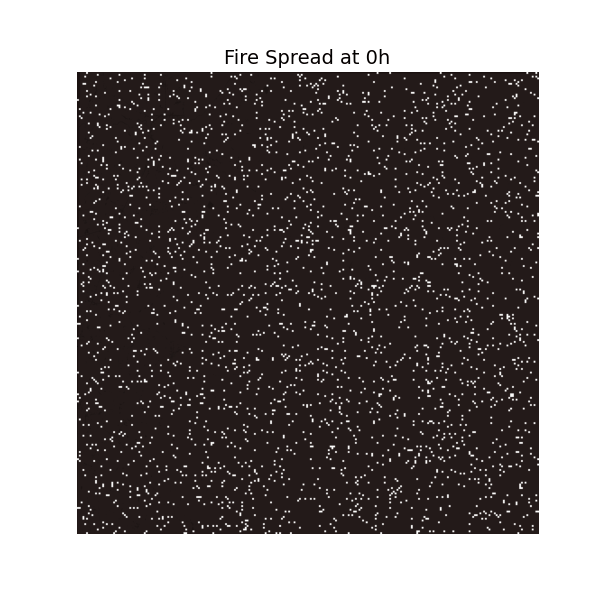

In [180]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation, PillowWriter

# === Input paths
dem_path = "dem_utm.tif"
fuel_path = "aligned_inputs/fuel.tif"  # or wherever your aligned fuel is
spread_dir = "spread_outputs"
times = [0, 1, 2, 3, 4, 5]  # Available spread times

# === Load DEM and normalize
with rasterio.open(dem_path) as src:
    dem = src.read(1).astype(np.float32)
    dem = (dem - dem.min()) / (dem.max() - dem.min() + 1e-6)

# === Load fuel map and normalize
with rasterio.open(fuel_path) as src:
    fuel = src.read(1).astype(np.float32)
    fuel = (fuel - fuel.min()) / (fuel.max() - fuel.min() + 1e-6)

# === Load fire spread masks
spread_maps = []
for h in times:
    with rasterio.open(os.path.join(spread_dir, f"spread_{h}h.tif")) as src:
        spread = src.read(1)
        spread_maps.append(spread)

# === Create animation
fig, ax = plt.subplots(figsize=(6, 6))

def update(i):
    ax.clear()
    
    # 🔲 Background: DEM in grayscale
    ax.imshow(dem, cmap='gray', alpha=0.5)
    
    # 🟩 Fuel on top
    ax.imshow(fuel, cmap='YlGn', alpha=0.3)

    # 🔥 Fire spread on top
    ax.imshow(spread_maps[i], cmap='hot', alpha=0.9)
    
    ax.set_title(f"Fire Spread at {times[i]}h", fontsize=14)
    ax.axis('off')

# Save and display
anim = FuncAnimation(fig, update, frames=len(times), interval=1000)
anim.save("fire_spread_over_dem_fuel.gif", writer=PillowWriter(fps=1))
plt.close()

from IPython.display import Image
Image(filename="fire_spread_over_dem_fuel.gif")


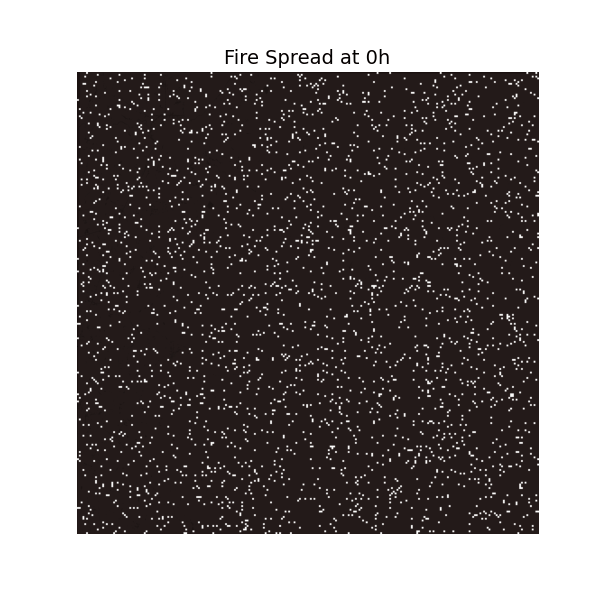

In [181]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation, PillowWriter

# === Input paths
dem_path = "dem_utm.tif"
fuel_path = "aligned_inputs/fuel.tif"  # or wherever your aligned fuel is
spread_dir = "spread_outputs"
times = [0, 1, 2, 3, 4, 5]  # Available spread times

# === Load DEM and normalize
with rasterio.open(dem_path) as src:
    dem = src.read(1).astype(np.float32)
    dem = (dem - dem.min()) / (dem.max() - dem.min() + 1e-6)

# === Load fuel map and normalize
with rasterio.open(fuel_path) as src:
    fuel = src.read(1).astype(np.float32)
    fuel = (fuel - fuel.min()) / (fuel.max() - fuel.min() + 1e-6)

# === Load fire spread masks
spread_maps = []
for h in times:
    with rasterio.open(os.path.join(spread_dir, f"spread_{h}h.tif")) as src:
        spread = src.read(1)
        spread_maps.append(spread)

# === Create animation
fig, ax = plt.subplots(figsize=(6, 6))

def update(i):
    ax.clear()
    
    # 🔲 Background: DEM in grayscale
    ax.imshow(dem, cmap='gray', alpha=0.5)
    
    # 🟩 Fuel on top
    ax.imshow(fuel, cmap='YlGn', alpha=0.3)

    # 🔥 Fire spread on top
    ax.imshow(spread_maps[i], cmap='hot', alpha=0.9)
    
    ax.set_title(f"Fire Spread at {times[i]}h", fontsize=14)
    ax.axis('off')

# Save and display
anim = FuncAnimation(fig, update, frames=len(times), interval=1000)
anim.save("fire_spread_over_dem_fuel.gif", writer=PillowWriter(fps=1))
plt.close()

from IPython.display import Image
Image(filename="fire_spread_over_dem_fuel.gif")
